# 1. Load dataset
#### In this assignment, you are expected to build a model that finds clusters in the given news articles dataset.
#### You will need to read the data from data file (news.xlsx). It contains three columns: news category, news title, and the news content.

In [1]:
import pandas as pd
data = pd.read_excel('news.xlsx')

In [2]:
data

,Category,Title,News_Article
0,Maraqlı,Naviforce Sport Saat 2016 ilə zövqlərin ahəngi,Naviforce Sport Saat 2016 Yapon Mexanizmi Yapo...
1,Maraqlı,"Sinir ,oynaq , sinir bel ağrılarına 3 gündə son !","ŞOK ! ŞOK ! ŞOK ! Xanımlar və bəylər , bel və ..."
2,Maraqlı,Dəyərindən qat-qat aşağı qiymətə Mənzil,Dəyərindən qat-qat Aşağı Qiymətə. Həzi Aslanov...
3,İdman,2024 və 2028-ci il olimpiadalarının keçiriləcə...,2028-ci il Yay Olimpiya və Paralimpiya Oyunla...
4,Dünya,Türkiyədə zəlzələ,Türkiyədə daha bir zəlzələ meydana gəlib. L...
...,...,...,...
49995,Siyasət,Əli Kərimli terrorçularla da əməkdaşlığa hazır...,"AXCP sədri ""Milli Şura""nın mitinqində qəsdən..."
49996,Siyasət,Elşən Musayev: “Bəlkə elə o terrorist Əli Kəri...,"""Ümumiyyətlə, Milli Şuraya xoş olan, hətta o..."
49997,Dünya,İstanbulda 52 mərtəbəli binada yanğın baş verib,Türkiyənin İstanbul şəhərinin Ataşehir rayon...
49998,Dünya,“Onlar cinayətkarlardır və bir-bir məhv edilir...,Rusiyanı tərk edərək İŞİD sıralarında döyüşə...


# 2. Data preprocessing
#### You are expected to extract features from the news articles using tf-idf representation techniques. You can use TfidfVectorizer for this purpose. You may want to limit the vocabulary size by choosing most frequent 3000 tokens. Experiment with different sizes.

In [3]:
y = data.iloc[:, 0]
x = data.iloc[:, 2]
print(y, x)

0             Maraqlı
1             Maraqlı
2             Maraqlı
3               İdman
4               Dünya
             ...     
49995         Siyasət
49996         Siyasət
49997           Dünya
49998           Dünya
49999    İqtisadiyyat
Name: Category, Length: 50000, dtype: object 0        Naviforce Sport Saat 2016 Yapon Mexanizmi Yapo...
1        ŞOK ! ŞOK ! ŞOK ! Xanımlar və bəylər , bel və ...
2        Dəyərindən qat-qat Aşağı Qiymətə. Həzi Aslanov...
3         2028-ci il Yay Olimpiya və Paralimpiya Oyunla...
4         Türkiyədə daha bir zəlzələ meydana gəlib.   L...
                               ...                        
49995      AXCP sədri "Milli Şura"nın mitinqində qəsdən...
49996      "Ümumiyyətlə, Milli Şuraya xoş olan, hətta o...
49997      Türkiyənin İstanbul şəhərinin Ataşehir rayon...
49998      Rusiyanı tərk edərək İŞİD sıralarında döyüşə...
49999     Ukrayna Mərkəzi Bankı (NBU) bu gün keçirdiyi ...
Name: News_Article, Length: 50000, dtype: object


In [4]:
from sklearn.model_selection import train_test_split

SEED = 42
x_train, x_test, y_train, y_test = \
                train_test_split(x, y, test_size = 0.2, random_state = SEED)

In [5]:
x_train

39087      Avropa Şurası Parlament Assambleyasının (AŞP...
30893     Xəyal Məmmədxanlı: “Xüsusi ilə könüllü sığort...
45278    ABŞ Türkiyə vətəndaşlarına müalicə və digər tə...
16398      Ermənistanda Avrasiya İqtisadi İttifaqından ...
13653     Ermənistan silahlı qüvvələrinin bölmələri cəb...
                               ...                        
11284    DÇ-2018-in seçmə mərhələsinin UEFA zonası üzrə...
44732      Sentyabr ayında Türkiyə parlamentinin deputa...
38158     Dünyada film izləməyən adam yoxdur. Bəziləri ...
860       Oriental Asenanın sevgilisi Hasan Derenin şəx...
15795     "Qarabağ"ın "Çelsi" ilə İngiltərədə keçirəcəy...
Name: News_Article, Length: 40000, dtype: object

In [6]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer(max_features = 3000)
x_train_tfidf = tfidf.fit_transform(x_train)
x_test_tfidf = tfidf.transform(x_test)

In [7]:
x_train_tfidf

<40000x3000 sparse matrix of type '<class 'numpy.float64'>'
	with 2664988 stored elements in Compressed Sparse Row format>

# 3. PCA
#### Apply PCA on the prepared data with 3 components.

In [8]:
from sklearn.decomposition import TruncatedSVD
trunc = TruncatedSVD(n_components = 3)
x_train_tfidf = trunc.fit_transform(x_train_tfidf)

In [9]:
x_train_tfidf[:, 0]

array([0.21579181, 0.21334264, 0.22332531, ..., 0.37670252, 0.34182002,
       0.14010786])

# 4. Visualization
#### Visualize the data in 3D.

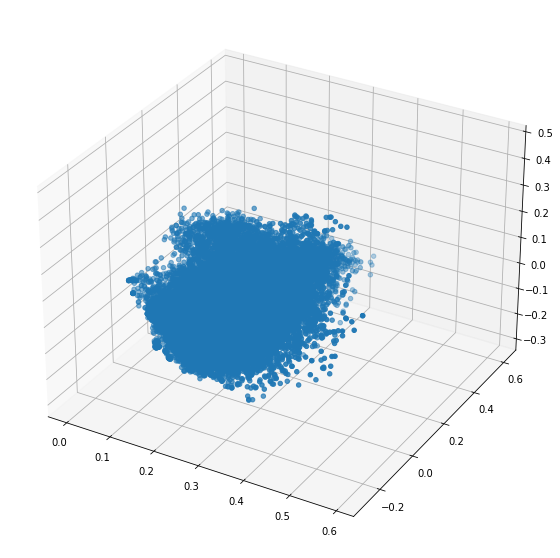

In [10]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection = '3d')

xs =  x_train_tfidf[:, 0]
ys =  x_train_tfidf[:, 1]
zs =  x_train_tfidf[:, 2]

ax.scatter3D(xs, ys, zs)

# 5. Clustering
#### Apply Kmeans clustering on the data.

In [11]:
from sklearn.cluster import KMeans
SEED = 42

l = []

for n in range(1, 10):
    kmeans = KMeans(n_clusters = n, random_state = SEED).fit(x_train_tfidf)
    l.append(kmeans.inertia_)

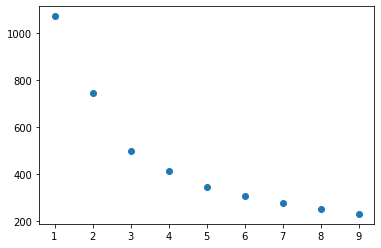

In [12]:
x_elbow = [i for i in range(1,10)]
y_elbow = l

plt.scatter(x_elbow, y_elbow)

In [13]:
kmeans = KMeans(n_clusters = 6, random_state = SEED).fit(x_train_tfidf)

# 6. Visualization
#### Visualize the data in 3D with cluster as color. Use plotly to make it interactive.
#### Your plot should look like the following:
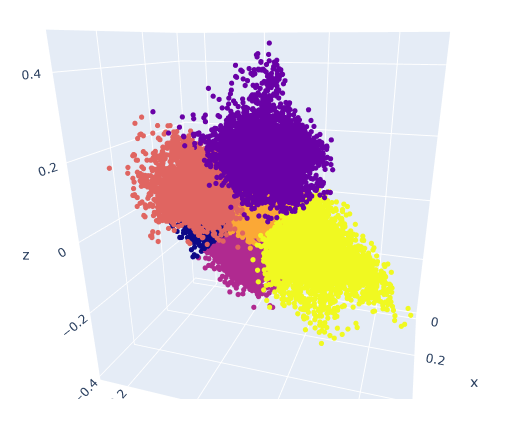

In [14]:
import plotly.express as px
fig = px.scatter_3d(x = xs, y = ys, z= zs, color=kmeans.labels_)
fig.show()